In [1]:
import cv2
import numpy as np
import random
import math
import os
import shutil as sh
import random
from skimage.metrics import structural_similarity as ssim
import statistics
from skimage.metrics import structural_similarity as ssim
import matplotlib.pyplot as plt

import copy
from skimage.io import imread, imsave
from skimage.transform import resize
from skimage import img_as_ubyte

from models.TwoHeadsNetwork import TwoHeadsNetwork

import torch
from torchvision import transforms
from torchvision.utils import make_grid
from utils.visualization import save_kernels_grid
import pickle

In [2]:
K = 25  # number of elements in the base
model_file = '/mnt/sdd1/sarthakagarwal/misc/front_cam_data_augmentation/NonUniformBlurKernelEstimation/TwoHeads.pkl'
two_heads = TwoHeadsNetwork(K)

print('Loading weights model')
two_heads.load_state_dict(torch.load(model_file, map_location=torch.device('cpu')))
two_heads.eval()

transform = transforms.Compose([
    transforms.ToTensor()
])

fname_to_kernel_strength_map = []

def get_blur_kernel(blurry_image_filename):
    blurry_image = imread(blurry_image_filename)
    blurry_tensor = transform(blurry_image)
    blurry_tensor_to_compute_kernels = blurry_tensor**2.2 - 0.5
    kernels_estimated, masks_estimated = two_heads(blurry_tensor_to_compute_kernels[None, :, :, :])
    masks = masks_estimated.detach().numpy()
    all_masks = masks[0, :, :, :]
    mask_sums = np.sum(all_masks, axis=(1, 2))
    biggest_mask_index = np.argmax(mask_sums)

    blur_kernel = kernels_estimated[0, biggest_mask_index, :, :]

    return blur_kernel.detach().numpy()

Loading weights model


In [3]:
file_path = '/mnt/sdd1/sarthakagarwal/misc/dataset_version_4_26_july/all_handheld_images/all_handheld_images_frontcam/j_and_a__4375404692216721__6_372788/lux_6.372788_4375404692216721_FON_Front_LR_0_ev_-24.000000_lowerexp.jpg'

old_kernel = get_blur_kernel(file_path)

In [4]:
def calculate_kernel_spread(kernel):
    # Step 1: Normalize the kernel
    normalized_kernel = kernel / np.sum(kernel)

    # Step 2: Calculate the centroid
    centroid_x = np.sum(np.arange(kernel.shape[0]) * normalized_kernel)
    centroid_y = np.sum(np.arange(kernel.shape[1]) * normalized_kernel)

    # Step 3: Calculate second-order moments
    mu_xx = np.sum((np.arange(kernel.shape[0]) - centroid_x) ** 2 * normalized_kernel)
    mu_yy = np.sum((np.arange(kernel.shape[1]) - centroid_y) ** 2 * normalized_kernel)
    mu_xy = np.sum((np.arange(kernel.shape[0]) - centroid_x)[:, np.newaxis]
                   * (np.arange(kernel.shape[1]) - centroid_y) * normalized_kernel)

    # Step 4: Construct the covariance matrix
    covariance_matrix = np.array([[mu_xx, mu_xy], [mu_xy, mu_yy]])

    # Step 5: Find eigenvalues
    eigenvalues, _ = np.linalg.eigh(covariance_matrix)

    # Step 6: Calculate the overall spread as the mean of the eigenvalues
    overall_spread = np.mean(eigenvalues)

    return overall_spread

In [5]:
print(f'Old kernel strenght : {calculate_kernel_spread(old_kernel)}')

Old kernel strenght : 2.3162746699649466


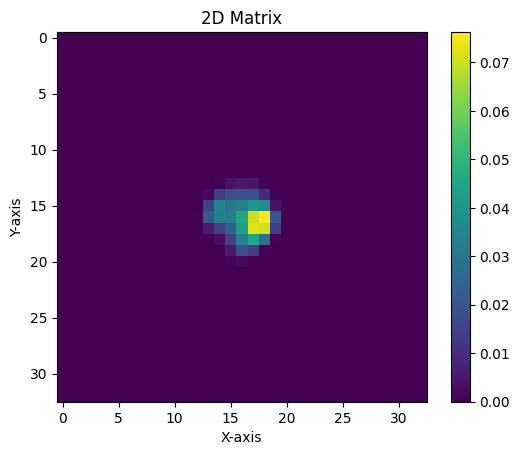

In [6]:
plt.imshow(old_kernel, cmap='viridis')  # You can choose a different colormap if you prefer
plt.colorbar()  # Add a colorbar to show the mapping of values to colors
plt.title("2D Matrix")
plt.xlabel("X-axis")
plt.ylabel("Y-axis")
plt.show()

In [17]:
def reinhard_tone_mapping(image, current_ev=-24, target_ev=0):
    # Calculate the scaling factor for exposure compensation
    scale_factor = 2 ** (target_ev - current_ev)

    # Convert the PIL image to a PyTorch tensor
    image_tensor = transforms.ToTensor()(image)

    # Apply exposure compensation with Reinhard tone mapping
    tone_mapped_tensor = image_tensor * scale_factor 

    # Clamp the tensor values to [0, 1]
    tone_mapped_tensor = torch.clamp(tone_mapped_tensor, 0, 1)

    # Convert the tensor back to a PIL image
    tone_mapped_image = transforms.ToPILImage()(tone_mapped_tensor)

    return tone_mapped_image

In [34]:
def change_mean(image):
    np_image = np.array(image)
    current_mean = np_image.mean()
    desired_mean = 127
    adjustment = desired_mean - current_mean
    adjusted_image = np_image + adjustment
    adjusted_image = np.clip(adjusted_image, 0, 255).astype(np.uint8)
    return adjusted_image

In [35]:
def get_blur_kernel_new(blurry_image_filename):
    blurry_image = imread(blurry_image_filename)
    blurry_image = change_mean(blurry_image)
    blurry_tensor = transform(blurry_image)
    blurry_tensor_to_compute_kernels = blurry_tensor**2.2 - 0.5
    kernels_estimated, masks_estimated = two_heads(blurry_tensor_to_compute_kernels[None, :, :, :])
    masks = masks_estimated.detach().numpy()
    all_masks = masks[0, :, :, :]
    mask_sums = np.sum(all_masks, axis=(1, 2))
    biggest_mask_index = np.argmax(mask_sums)

    blur_kernel = kernels_estimated[0, biggest_mask_index, :, :]

    return blur_kernel.detach().numpy()

In [29]:
bimg = imread(file_path)

In [30]:
bimg

array([[[ 2,  2,  2],
        [ 3,  3,  3],
        [ 3,  3,  3],
        ...,
        [ 1,  2,  4],
        [ 2,  3,  5],
        [ 1,  2,  4]],

       [[ 2,  2,  2],
        [ 3,  3,  3],
        [ 3,  3,  3],
        ...,
        [ 2,  3,  5],
        [ 2,  3,  5],
        [ 2,  3,  5]],

       [[ 2,  2,  2],
        [ 2,  2,  2],
        [ 3,  3,  3],
        ...,
        [ 1,  2,  4],
        [ 1,  2,  4],
        [ 1,  2,  4]],

       ...,

       [[ 1,  3,  2],
        [ 1,  3,  2],
        [ 1,  3,  2],
        ...,
        [ 8, 22, 35],
        [ 8, 22, 35],
        [ 6, 20, 33]],

       [[ 1,  3,  2],
        [ 1,  3,  2],
        [ 0,  2,  1],
        ...,
        [ 9, 23, 36],
        [12, 26, 39],
        [11, 25, 38]],

       [[ 0,  2,  1],
        [ 0,  2,  1],
        [ 0,  2,  1],
        ...,
        [ 5, 19, 32],
        [ 7, 21, 34],
        [ 4, 18, 31]]], dtype=uint8)

In [31]:
bimg_tensor = transform(bimg)

In [32]:
bimg_tensor

tensor([[[0.0078, 0.0118, 0.0118,  ..., 0.0039, 0.0078, 0.0039],
         [0.0078, 0.0118, 0.0118,  ..., 0.0078, 0.0078, 0.0078],
         [0.0078, 0.0078, 0.0118,  ..., 0.0039, 0.0039, 0.0039],
         ...,
         [0.0039, 0.0039, 0.0039,  ..., 0.0314, 0.0314, 0.0235],
         [0.0039, 0.0039, 0.0000,  ..., 0.0353, 0.0471, 0.0431],
         [0.0000, 0.0000, 0.0000,  ..., 0.0196, 0.0275, 0.0157]],

        [[0.0078, 0.0118, 0.0118,  ..., 0.0078, 0.0118, 0.0078],
         [0.0078, 0.0118, 0.0118,  ..., 0.0118, 0.0118, 0.0118],
         [0.0078, 0.0078, 0.0118,  ..., 0.0078, 0.0078, 0.0078],
         ...,
         [0.0118, 0.0118, 0.0118,  ..., 0.0863, 0.0863, 0.0784],
         [0.0118, 0.0118, 0.0078,  ..., 0.0902, 0.1020, 0.0980],
         [0.0078, 0.0078, 0.0078,  ..., 0.0745, 0.0824, 0.0706]],

        [[0.0078, 0.0118, 0.0118,  ..., 0.0157, 0.0196, 0.0157],
         [0.0078, 0.0118, 0.0118,  ..., 0.0196, 0.0196, 0.0196],
         [0.0078, 0.0078, 0.0118,  ..., 0.0157, 0.0157, 0.

In [36]:
new_kernel = get_blur_kernel_new(file_path)


In [47]:
print(f'New kernel strenght : {calculate_kernel_spread(new_kernel)}')

New kernel strenght : 3.29649641440468


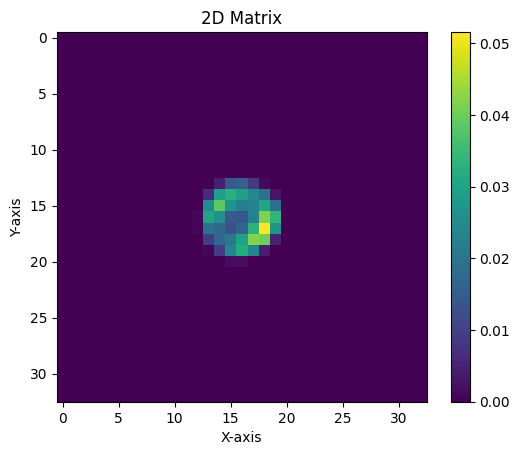

In [48]:
plt.imshow(new_kernel, cmap='viridis')  # You can choose a different colormap if you prefer
plt.colorbar()  # Add a colorbar to show the mapping of values to colors
plt.title("2D Matrix")
plt.xlabel("X-axis")
plt.ylabel("Y-axis")
plt.show()

In [12]:
img = imread(file_path)

In [49]:
from PIL import Image, ImageEnhance

In [50]:
im = Image.open(file_path)

In [51]:
im3 = ImageEnhance.Brightness(im)

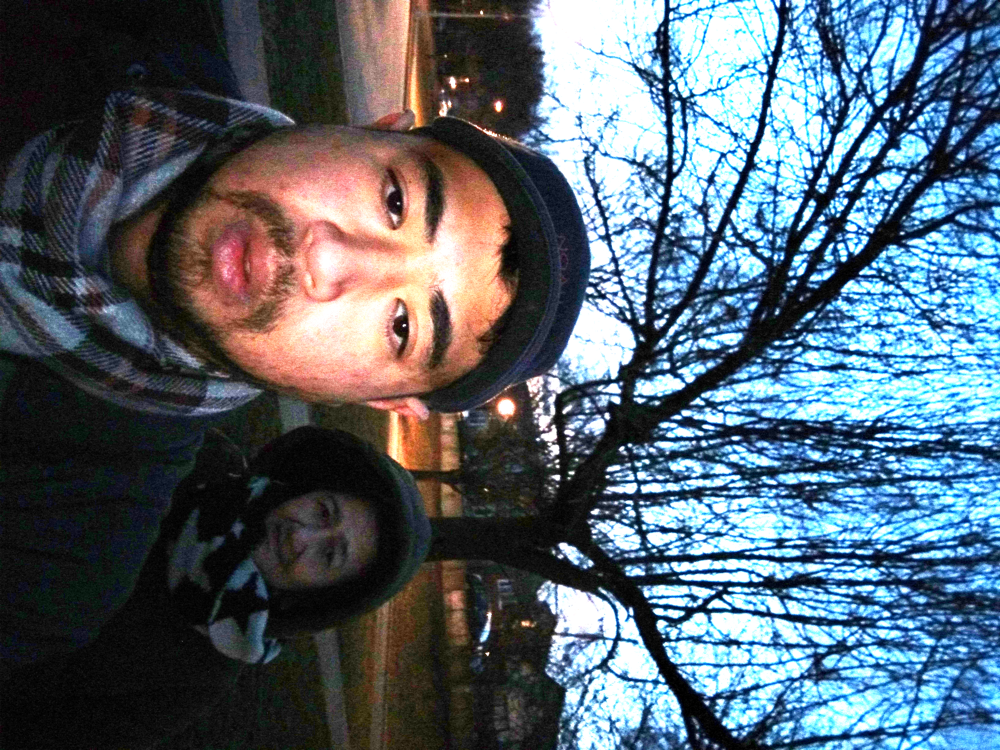

In [55]:
im3.enhance(8.0).show()

In [56]:
enhanced_image = im3.enhance(8.0)

In [57]:
def get_blur_kernel_xxx(blurry_image):
    blurry_tensor = transform(blurry_image)
    blurry_tensor_to_compute_kernels = blurry_tensor**2.2 - 0.5
    kernels_estimated, masks_estimated = two_heads(blurry_tensor_to_compute_kernels[None, :, :, :])
    masks = masks_estimated.detach().numpy()
    all_masks = masks[0, :, :, :]
    mask_sums = np.sum(all_masks, axis=(1, 2))
    biggest_mask_index = np.argmax(mask_sums)

    blur_kernel = kernels_estimated[0, biggest_mask_index, :, :]

    return blur_kernel.detach().numpy()

In [58]:
kernel_xxx = get_blur_kernel_xxx(enhanced_image)

In [59]:
print(f'kernel_xxx : {calculate_kernel_spread(kernel_xxx)}')

kernel_xxx : 0.5786581640779213


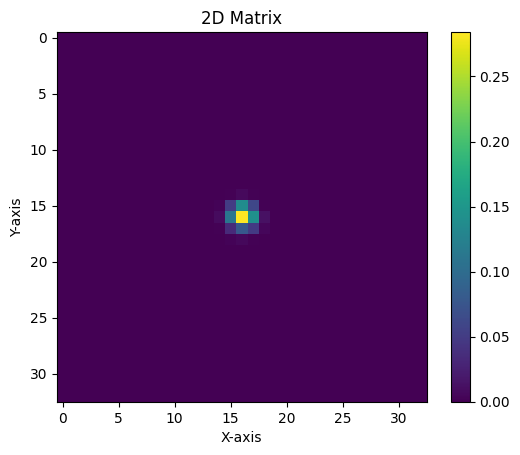

In [60]:
plt.imshow(kernel_xxx, cmap='viridis')  # You can choose a different colormap if you prefer
plt.colorbar()  # Add a colorbar to show the mapping of values to colors
plt.title("2D Matrix")
plt.xlabel("X-axis")
plt.ylabel("Y-axis")
plt.show()